In [9]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans
import itertools
import time

# Methods definition

In [4]:
# Method to calculate K means

from __future__ import division
import random
import numpy as np
from scipy.spatial.distance import cdist  # $scipy/spatial/distance.py
    # http://docs.scipy.org/doc/scipy/reference/spatial.html
from scipy.sparse import issparse  # $scipy/sparse/csr.py


#...............................................................................
def kmeans( X, centres, delta=.001, maxiter=10, metric='mahalanobis', p=2, verbose=1 ):
    """ centres, Xtocentre, distances = kmeans( X, initial centres ... )
    in:
        X N x dim  may be sparse
        centres k x dim: initial centres, e.g. random.sample( X, k )
        delta: relative error, iterate until the average distance to centres
            is within delta of the previous average distance
        maxiter
        metric: any of the 20-odd in scipy.spatial.distance
            "chebyshev" = max, "cityblock" = L1, "minkowski" with p=
            or a function( Xvec, centrevec ), e.g. Lqmetric below
        p: for minkowski metric -- local mod cdist for 0 < p < 1 too
        verbose: 0 silent, 2 prints running distances
    out:
        centres, k x dim
        Xtocentre: each X -> its nearest centre, ints N -> k
        distances, N
    see also: kmeanssample below, class Kmeans below.
    """
    if not issparse(X):
        X = np.asanyarray(X)  # ?
    centres = centres.todense() if issparse(centres) \
        else centres.copy()
    N, dim = X.shape
    k, cdim = centres.shape
    if dim != cdim:
        raise ValueError( "kmeans: X %s and centres %s must have the same number of columns" % (
            X.shape, centres.shape ))
    if verbose:
        print ("kmeans: X %s  centres %s  delta=%.2g  maxiter=%d  metric=%s" % (
            X.shape, centres.shape, delta, maxiter, metric))
    allx = np.arange(N)
    prevdist = 0
    for jiter in range( 1, maxiter+1 ):
        D = cdist_sparse( X, centres, metric=metric, p=p )  # |X| x |centres|
        xtoc = D.argmin(axis=1)  # X -> nearest centre
        distances = D[allx,xtoc]
        avdist = distances.mean()  # median ?
        if verbose >= 2:
            print ("kmeans: av |X - nearest centre| = %.4g" % avdist)
        if (1 - delta) * prevdist <= avdist <= prevdist \
        or jiter == maxiter:
            break
        prevdist = avdist
        for jc in range(k):  # (1 pass in C)
            c = np.where( xtoc == jc )[0]
            if len(c) > 0:
                centres[jc] = X[c].mean( axis=0 )
    if verbose:
        print ("kmeans: %d iterations  cluster sizes:" % jiter, np.bincount(xtoc))
    if verbose >= 2:
        r50 = np.zeros(k)
        r90 = np.zeros(k)
        for j in range(k):
            dist = distances[ xtoc == j ]
            if len(dist) > 0:
                r50[j], r90[j] = np.percentile( dist, (50, 90) )
        print ("kmeans: cluster 50 % radius", r50.astype(int))
        print ("kmeans: cluster 90 % radius", r90.astype(int))
            # scale L1 / dim, L2 / sqrt(dim) ?
    return centres, xtoc, distances

#...............................................................................
def kmeanssample( X, k, nsample=0, **kwargs ):
    """ 2-pass kmeans, fast for large N:
        1) kmeans a random sample of nsample ~ sqrt(N) from X
        2) full kmeans, starting from those centres
    """
        # merge w kmeans ? mttiw
        # v large N: sample N^1/2, N^1/2 of that
        # seed like sklearn ?
    N, dim = X.shape
    if nsample == 0:
        nsample = max( 2*np.sqrt(N), 10*k )
    Xsample = randomsample( X, int(nsample) )
    pass1centres = randomsample( X, int(k) )
    samplecentres = kmeans( Xsample, pass1centres, **kwargs )[0]
    return kmeans( X, samplecentres, **kwargs )

def cdist_sparse( X, Y, **kwargs ):
    """ -> |X| x |Y| cdist array, any cdist metric
        X or Y may be sparse -- best csr
    """
        # todense row at a time, v slow if both v sparse
    sxy = 2*issparse(X) + issparse(Y)
    if sxy == 0:
        return cdist( X, Y, **kwargs )
    d = np.empty( (X.shape[0], Y.shape[0]), np.float64 )
    if sxy == 2:
        for j, x in enumerate(X):
            d[j] = cdist( x.todense(), Y, **kwargs ) [0]
    elif sxy == 1:
        for k, y in enumerate(Y):
            d[:,k] = cdist( X, y.todense(), **kwargs ) [0]
    else:
        for j, x in enumerate(X):
            for k, y in enumerate(Y):
                d[j,k] = cdist( x.todense(), y.todense(), **kwargs ) [0]
    return d

def randomsample( X, n ):
    """ random.sample of the rows of X
        X may be sparse -- best csr
    """
    sampleix = random.sample( xrange( X.shape[0] ), int(n) )
    return X[sampleix]

def nearestcentres( X, centres, metric="euclidean", p=2 ):
    """ each X -> nearest centre, any metric
            euclidean2 (~ withinss) is more sensitive to outliers,
            cityblock (manhattan, L1) less sensitive
    """
    D = cdist( X, centres, metric=metric, p=p )  # |X| x |centres|
    return D.argmin(axis=1)

def Lqmetric( x, y=None, q=.5 ):
    # yes a metric, may increase weight of near matches; see ...
    return (np.abs(x - y) ** q) .mean() if y is not None \
        else (np.abs(x) ** q) .mean()

#...............................................................................
class Kmeans:
    """ km = Kmeans( X, k= or centres=, ... )
        in: either initial centres= for kmeans
            or k= [nsample=] for kmeanssample
        out: km.centres, km.Xtocentre, km.distances
        iterator:
            for jcentre, J in km:
                clustercentre = centres[jcentre]
                J indexes e.g. X[J], classes[J]
    """
    def __init__( self, X, k=0, centres=None, nsample=0, **kwargs ):
        self.X = X
        if centres is None:
            self.centres, self.Xtocentre, self.distances = kmeanssample(
                X, k=k, nsample=nsample, **kwargs )
        else:
            self.centres, self.Xtocentre, self.distances = kmeans(
                X, centres, **kwargs )

    def __iter__(self):
        for jc in range(len(self.centres)):
            yield jc, (self.Xtocentre == jc)
            
#...............................................................................

def create_clusters(K,X):
    initial_centres = X[np.random.randint(X.shape[0], size=K), :]

    out = kmeans( X, initial_centres, delta=.001, maxiter=10, metric="mahalanobis", p=2, verbose=1 ) # Returns centres, xtoc, distances
    # Shape of centres is Kxdim here 2000x128
    # Shape of xtoc is (dim,), it holds to which cluster each of data point belongs
    # Shape of distance is (dim,), it holds distance of each data point to nearest cluster
    return out

#...............................................................................

# Frequency matrix

def createFreqMatrix(descriptors,K,length,out):

    freqmat = np.zeros((length,K))
    for i in range(length):
        D = cdist_sparse( descriptors[i], out, metric='mahalanobis')
        xtoc = D.argmin(axis=1)
        for jc in range(K):  # (1 pass in C)
                c = np.where( xtoc == jc )[0]
                if len(c) > 0:
                    freqmat[i][jc] = len(c)
    return freqmat

#...............................................................................

# Creating TF-IDF Matrix

def createTfIdf(K,freqmat):
    colsum = np.sum(freqmat,axis=1) # len(frames)x1
    tf = freqmat/(colsum[0])
    df = np.zeros((1,K))

    for i in range (K):
        df[:,i] = (np.where(freqmat[:,i]>0)[0].shape[0]) # No of docs/frames which have the i th cluster atleast once
    idf = np.log(len(frames)/(1+df[0]))

    tf_idf = tf*idf
    return tf_idf,idf

#...............................................................................

# Vectorize the descriptor

def vectorize(descriptors,out,idf,K):
    D = cdist_sparse( descriptors, out, metric='mahalanobis') #shape of D is len(descriptors) x no of clusters (K)
    xtoc = D.argmin(axis=1) #shape of xtoc is len(descriptors,)
    
    # Create row vq
    vq = np.zeros((1,K))
    for jc in range(K):  # (1 pass in C)
            c = np.where( xtoc == jc )[0]
            if len(c) > 0:
                vq[0][jc] = len(c)
    
    tf = vq/len(descriptors) # Term frequency

    tf_idf = tf*idf
    return tf_idf

#...............................................................................

# Finding ranking of frames to which new selected data region belongs to

def findRanking(freqmat,vq):
    fd = np.dot(freqmat,vq.T)
    fd = fd/np.linalg.norm(vq)
    fd = fd/np.linalg.norm(freqmat,axis=1)[0]
    return fd

#...............................................................................

In [3]:
cap = cv2.VideoCapture('../logo2.mp4')
# Frame shape-(h-720xw-1280)
fps = cap.get(cv2.CAP_PROP_FPS)
print(fps)

30.0


# Capture video frames

In [12]:
cap = cv2.VideoCapture('../movie.mp4')
# Frame shape-(h-720xw-1280)
fps = cap.get(cv2.CAP_PROP_FPS)
frames = []
corners = []
descriptors_h =[]
descriptors_m =[]
i=0
frame_no=0

retval=cv2.xfeatures2d.HarrisLaplaceFeatureDetector_create(6,0.01,0.01,5000,4)
sift = cv2.xfeatures2d.SIFT_create()
count = 0
while(i<=2000):
    i=i+1
    ret, frame = cap.read()
    if ret == True:
        if(i == 1+(int(fps)*frame_no)): #Reading 1 frame per second as FPS         
            frame_no += 1
            count += 1
            frame = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)
            frames.append(frame)
            
            keypoints_h, descriptors_harris = sift.compute(frame,retval.detect(frame,None))
            
            if descriptors_harris is not None:
                descriptors_h.append(descriptors_harris)
            
    else: 
        break

# When everything done, release the video capture object
cap.release() 
# Closes all the frames
cv2.destroyAllWindows()
        
frames = np.stack(frames)

merged_h = list(itertools.chain.from_iterable(descriptors_h))
merged_h = np.stack(merged_h)

cluster_size_h = 2000


In [13]:
len(frames)

87

/home/chaitra/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  This is separate from the ipykernel package so we can avoid doing imports until


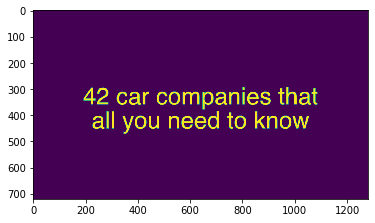

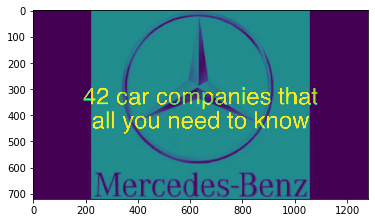

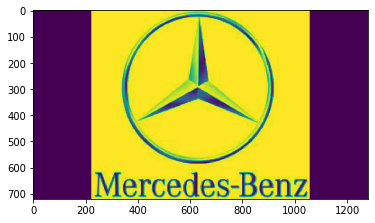

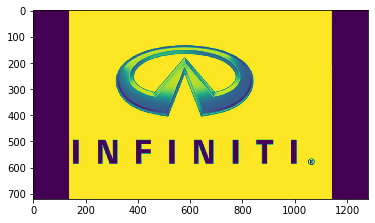

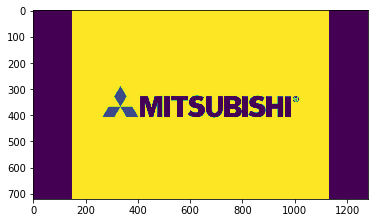

...

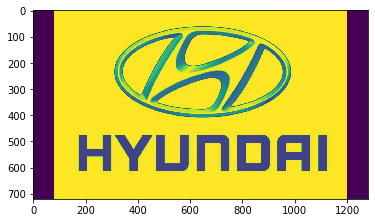

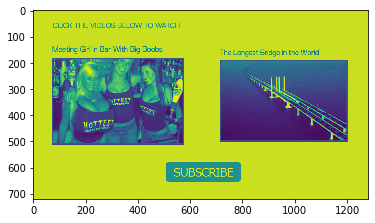

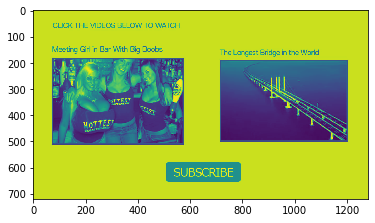

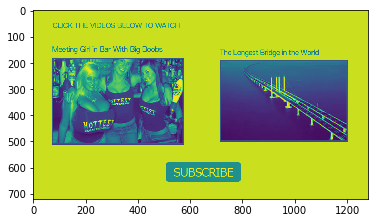

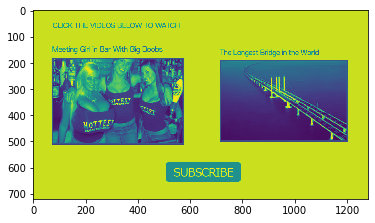

<Figure size 432x288 with 0 Axes>

In [10]:
for i in range(len(frames)):
    plt.imshow(frames[i])
    plt.figure()

# Create Clusters

In [12]:
t0 = time.time()
cluster_h = create_clusters(cluster_size_h,merged_h)
t1 = time.time()
total_h_clustering = t1-t0
print('Took', total_h_clustering/60,'m for clustering Harris feature points') #504 sec i.e. 8mins to run for 9 frames

# np.savetxt('./logo/centres_h.txt', cluster_h[0], fmt='%f')
# np.savetxt('./logo/xtoc_h.txt', cluster_h[1], fmt='%f')          
# np.savetxt('./logo/distances_h.txt', cluster_h[2], fmt='%f')


kmeans: X (27602, 128)  centres (2000, 128)  delta=0.001  maxiter=10  metric=mahalanobis
kmeans: 8 iterations  cluster sizes: [16  6  3 ... 10 21  6]
Took 39.82885065873464 m for clustering Harris feature points


In [14]:
np.save('logo_centres_h.npy', cluster_h[0])
np.save('logo_xtoc_h.npy', cluster_h[1])
np.save('logo_distances_h.npy', cluster_h[2])

In [ ]:
np.savetxt('../logo/centres_h.txt', cluster_h[0], fmt='%f')
np.savetxt('../pepsi/xtoc_h.txt', cluster_h[1], fmt='%f')
np.savetxt('../pepsi/distances_h.txt', cluster_h[2], fmt='%f')

np.savetxt('./text/freqMat_h_6000.txt', freqMat_h, fmt='%f')

In [21]:
cluster_h = np.loadtxt('../text/centres_h.txt', dtype=float),np.loadtxt('../text/xtoc_h.txt', dtype=float),np.loadtxt('../text/distances_h.txt', dtype=float)
freqMat_h = np.loadtxt('../text/freqMat_h.txt', dtype=float)

In [24]:
cluster_h[1].shape

(47636,)

In [103]:
assignments = np.load('../assignments.npy')
centroids = np.load('../centrois.npy')

In [15]:
freqMat_h = createFreqMatrix(descriptors_h,cluster_size_h,len(descriptors_h),cluster_h[0])

In [16]:
np.save('logo_freqMat_h.npy',freqMat_h)

In [60]:
freqMat_h = np.load('freqMat_h_6000.npy')

In [27]:
tfidf_h,idf_h = createTfIdf(cluster_size_h,freqMat_h)

# Testing

In [ ]:
%matplotlib inline
for i in range (len(frames)):
    plt.figure()
    plt.imshow(frames[i])

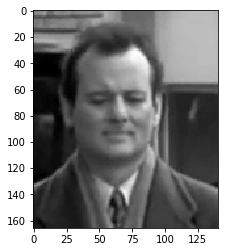

In [18]:
# Select ROI to test
if __name__ == '__main__' :
    im = frames[8]
    r = cv2.selectROI(im)
    imCrop = im[int(r[1]):int(r[1]+r[3]), int(r[0]):int(r[0]+r[2])]
#     imCrop = np.load('imCrop.npy')
    plt.imshow(imCrop,cmap='gray')

In [17]:
r

(787, 111, 256, 57)

In [131]:
np.save('ObjectQuery4.npy',imCrop)

In [132]:
# Get features of selected region
f = (imCrop.copy())

retval=cv2.xfeatures2d.HarrisLaplaceFeatureDetector_create(6,0.01,0.01,5000,4)
sift = cv2.xfeatures2d.SIFT_create()

region_keypoints_h, region_descriptors_harris = sift.compute(f,retval.detect(f,None))

vq_h = vectorize(region_descriptors_harris,cluster_h[0],idf_h,cluster_size_h)
fd_h = findRanking(freqMat_h,vq_h)


/home/chaitra/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:9: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  if __name__ == '__main__':


<Figure size 1332x756 with 0 Axes>

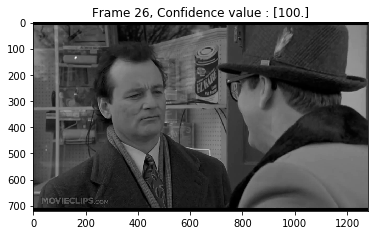

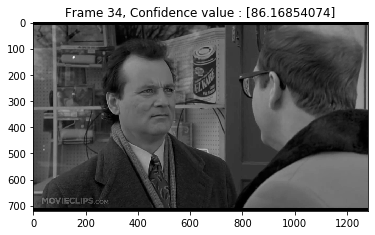

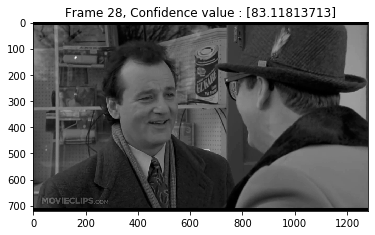

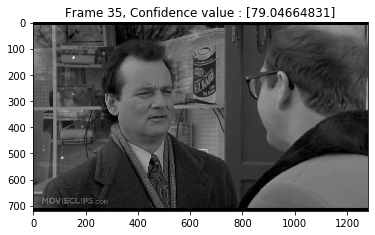

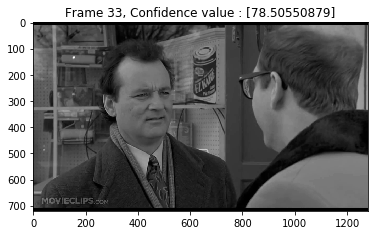

...

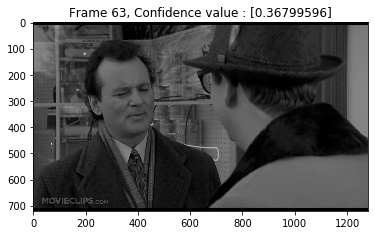

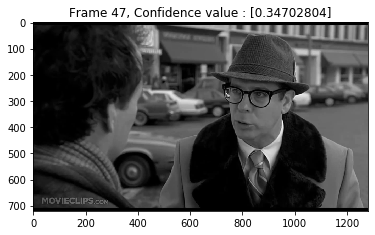

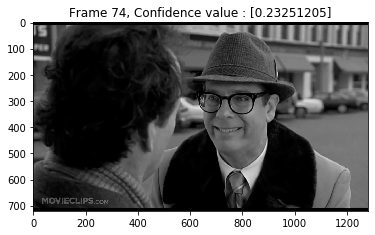

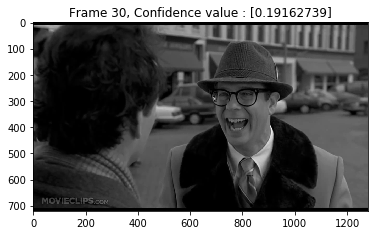

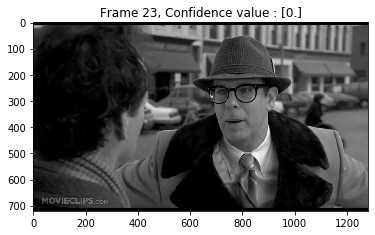

In [133]:
# Sort the frames by ranking and show the sorted frames
%matplotlib inline
fd_h=(fd_h-np.min(fd_h))/(np.max(fd_h)-np.min(fd_h))
fd_h_sorted = fd_h.argsort(axis=0)[::-1][:len(fd_h)]
fig = plt.figure()
fig.set_size_inches(18.5, 10.5)
for i in range (len(frames)):
#     fig.add_subplot(3,3,i+1)
    plt.figure()
    plt.imshow(frames[fd_h_sorted[i][0]],cmap='gray')
    plt.title('Frame '+str(fd_h_sorted[i][0])+', Confidence value : '+str(fd_h[fd_h_sorted[i,0]]*100))
#     plt.figure()
fig.tight_layout()
fig.savefig('test5.png', dpi=100)

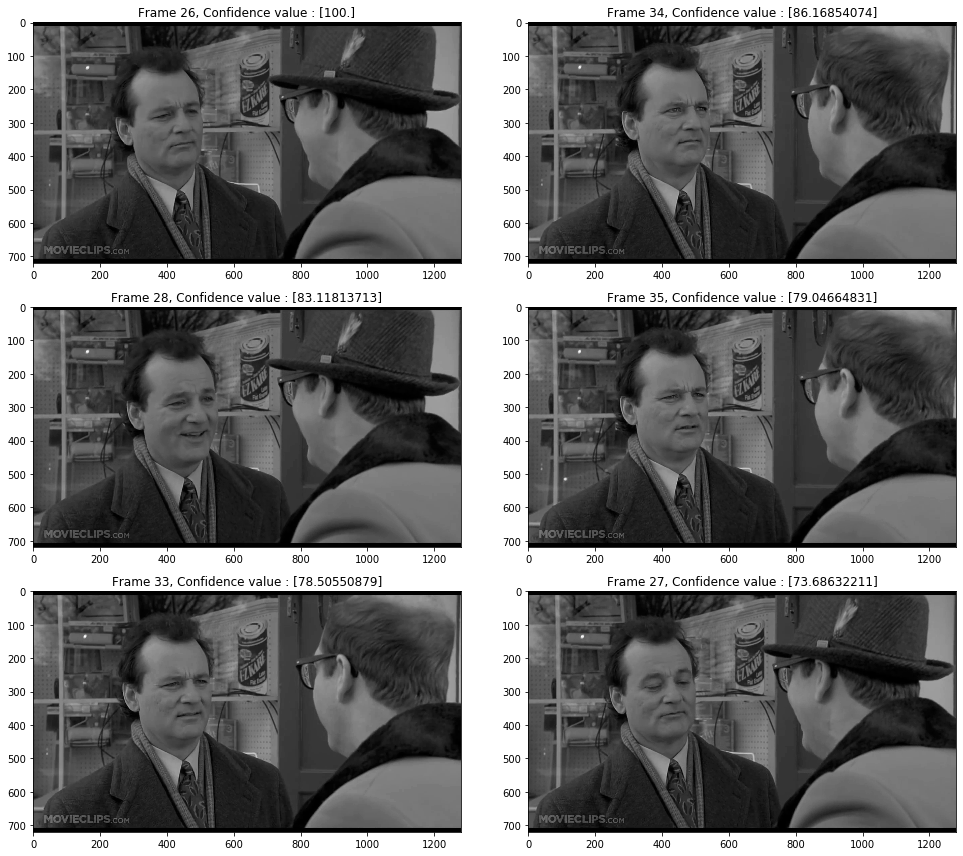

In [134]:
th = 50
count=0
fig=plt.figure()
fig.set_size_inches(14, 12)
for i in range (len(frames)):
    if (fd_h[fd_h_sorted[i,0]]*100>=th):
        count+=1
#         plt.figure()
        fig.add_subplot(3,2,i+1)
        plt.imshow(frames[fd_h_sorted[i][0]],cmap='gray')
        plt.title('Frame '+str(fd_h_sorted[i][0])+', Confidence value : '+str(fd_h[fd_h_sorted[i,0]]*100))
fig.tight_layout()

In [121]:
print(count)

0


/home/chaitra/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:4: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  after removing the cwd from sys.path.


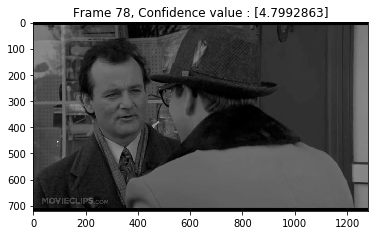

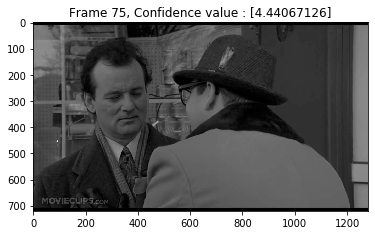

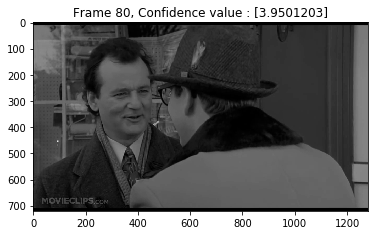

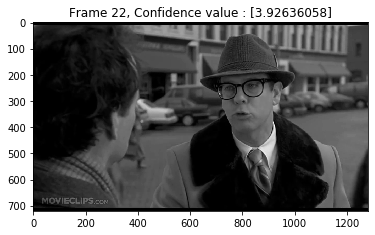

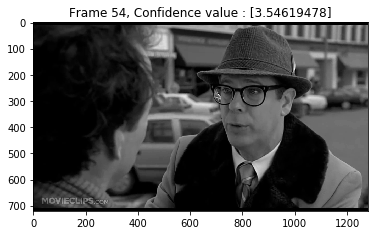

...

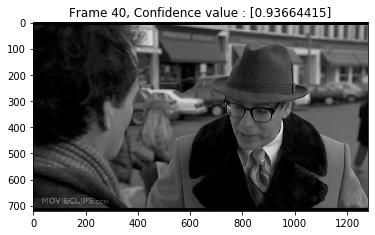

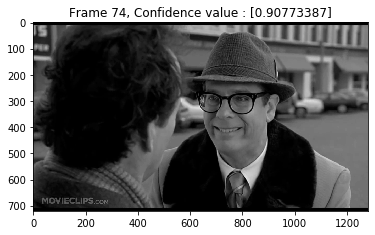

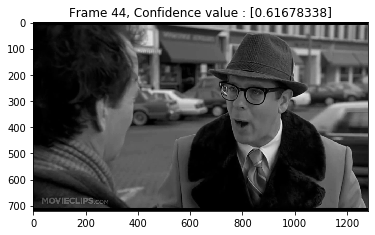

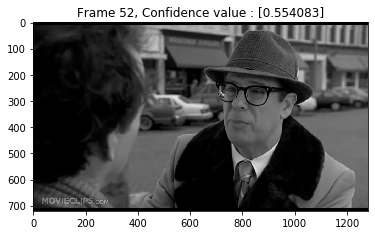

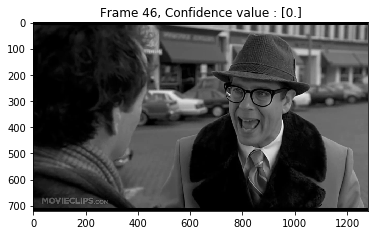

In [103]:
th = 5
for i in range (len(frames)):
    if (fd_h[fd_h_sorted[i,0]]*100<th):
        plt.figure()
        plt.imshow(frames[fd_h_sorted[i][0]],cmap='gray')
        plt.title('Frame '+str(fd_h_sorted[i][0])+', Confidence value : '+str(fd_h[fd_h_sorted[i,0]]*100))

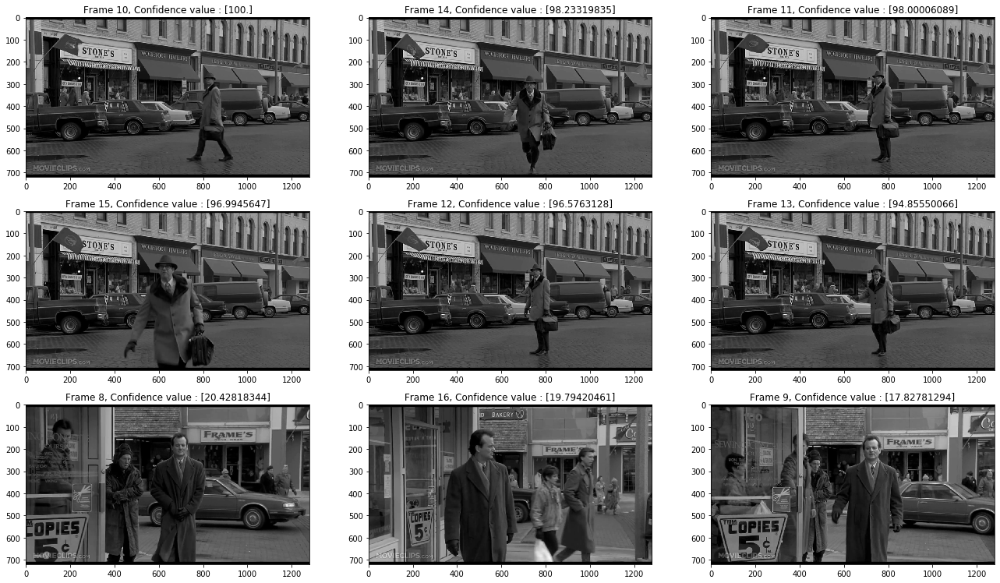

In [68]:
# Sort the frames by ranking and show the sorted frames
%matplotlib inline
fd_h=(fd_h-np.min(fd_h))/(np.max(fd_h)-np.min(fd_h))
fd_h_sorted = fd_h.argsort(axis=0)[::-1][:len(fd_h)]
fig = plt.figure()
fig.set_size_inches(18.5, 10.5)
for i in range (9):
    fig.add_subplot(3,3,i+1)
#     plt.figure()
    plt.imshow(frames[fd_h_sorted[i][0]],cmap='gray')
    plt.title('Frame '+str(fd_h_sorted[i][0])+', Confidence value : '+str(fd_h[fd_h_sorted[i,0]]*100))
#     plt.figure()
fig.tight_layout()
fig.savefig('test5.png', dpi=100)

In [135]:
objectQuery1 = np.load('ObjectQuery1.npy')
objectQuery2 = np.load('ObjectQuery2.npy')
objectQuery3 = np.load('ObjectQuery3.npy')
objectQuery4 = np.load('ObjectQuery4.npy')

Text(0.5, 0, 'objectQuery3')

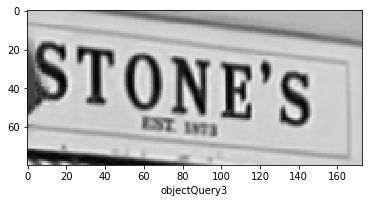

In [151]:
plt.imshow(objectQuery3,cmap='gray')
plt.xlabel('objectQuery3')

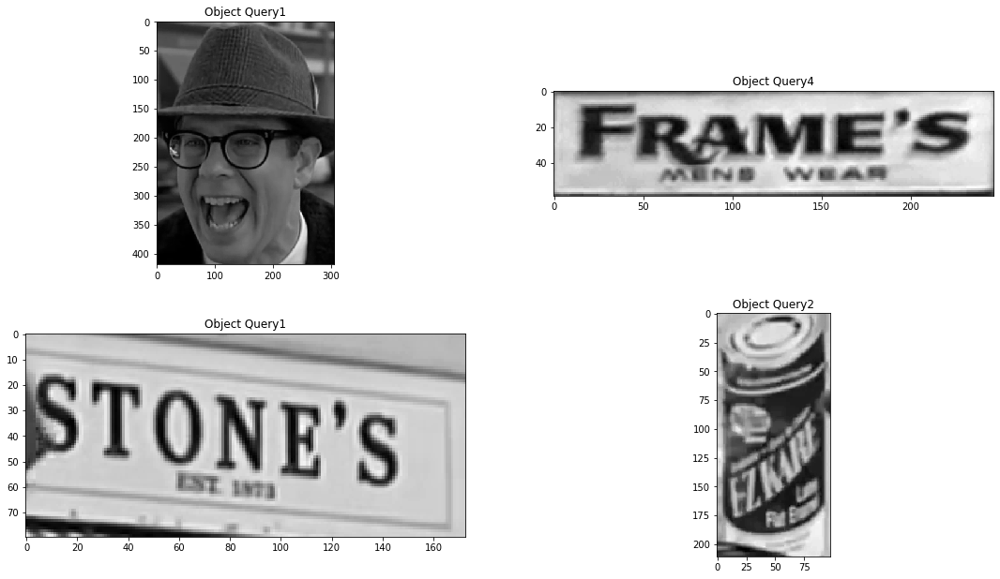

In [144]:
fig = plt.figure()
fig.set_size_inches(18.5, 10.5)
fig.add_subplot(2,2,1)
plt.title('Object Query1')
plt.imshow(objectQuery1,cmap='gray')
fig.add_subplot(2,2,2)
plt.title('Object Query4')
plt.imshow(objectQuery2,cmap='gray')
fig.add_subplot(2,2,3)
plt.title('Object Query1')
plt.imshow(objectQuery3,cmap='gray')
fig.add_subplot(2,2,4)
plt.title('Object Query2')
plt.imshow(objectQuery4,cmap='gray')
# fig.tight_layout()